<a href="https://colab.research.google.com/github/TuskiNinjaa/ObjectDetectionStreet/blob/master/Trabalho_IA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Trabalho 01

*   Professor: Edson Takashi Matsubara
*   Matéria: Inteligência Artificial
*   Turma: T01
*   Aluno: Vitor Yuske Watanabe
*   RGA: 2020.1905.058-4



## Realizando imports

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import os
from PIL import Image, ImageStat, ImageOps

import torchvision
import torchsummary
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics

from typing import Any, Tuple
from tqdm.notebook import tqdm

## Funções e Classes auxiliares

### Modelos

In [ ]:
class TaillowNet1(nn.Module):
    def __init__(self):
        super(TaillowNet1,self).__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(in_channels=3,out_channels=100,kernel_size=4,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=100,out_channels=100,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),            
            nn.Conv2d(in_channels=100,out_channels=100,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=100,out_channels=100,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3,stride=2,padding=0),
            
            nn.Conv2d(in_channels=100,out_channels=300,kernel_size=4,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=300,out_channels=300,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=300,out_channels=300,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=300,out_channels=300,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,stride=1,padding=0),
            
            nn.Flatten()
        )
        self.classifier = nn.Sequential(
            nn.Linear(300,900),
            nn.ReLU(),
            nn.Linear(900,900),
            nn.ReLU(),
            nn.Linear(900,100),
        )

    def forward(self,x):
        x = self.backbone(x)
        x = self.classifier(x)
        return x

In [ ]:
class TaillowNet0(nn.Module):
    def __init__(self):
        super(TaillowNet0,self).__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(in_channels=3,out_channels=50,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=50,out_channels=50,kernel_size=2,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3,stride=2,padding=0),
            
            nn.Conv2d(in_channels=50,out_channels=100,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=100,out_channels=100,kernel_size=2,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,stride=1,padding=0),
            
            nn.Conv2d(in_channels=100,out_channels=200,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=200,out_channels=200,kernel_size=2,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,stride=1,padding=0),
            
            nn.Conv2d(in_channels=200,out_channels=400,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=400,out_channels=400,kernel_size=2,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,stride=1,padding=0),
            
            nn.Flatten()
        )
        self.classifier = nn.Sequential(
            nn.Linear(1600,1000),
            nn.ReLU(),
            nn.Linear(1000,1000),
            nn.ReLU(),
            nn.Linear(1000,100),
        )

    def forward(self,x):
        x = self.backbone(x)
        x = self.classifier(x)
        return x

In [ ]:
class TaillowNet2(nn.Module):
    def __init__(self):
        super(TaillowNet2,self).__init__()
        self.backbone = nn.Sequential(
            nn.Conv2d(in_channels=3,out_channels=200,kernel_size=4,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=200,out_channels=200,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),            
            nn.Conv2d(in_channels=200,out_channels=200,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=200,out_channels=200,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=3,stride=2,padding=0),
            
            nn.Conv2d(in_channels=200,out_channels=400,kernel_size=4,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=400,out_channels=400,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=400,out_channels=400,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(in_channels=400,out_channels=400,kernel_size=3,stride=1,padding=0),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,stride=1,padding=0),
            
            nn.Flatten()
        )
        self.classifier = nn.Sequential(
            nn.Linear(400,1600),
            nn.ReLU(),
            nn.Linear(1600,1600),
            nn.ReLU(),
            nn.Linear(1600,100),
        )

    def forward(self,x):
        x = self.backbone(x)
        x = self.classifier(x)
        return x

### Funcoes

In [ ]:
def image_loader(img):
    return ImageOps.exif_transpose(Image.open(img).convert("RGB"))

In [ ]:
class RuaDataset(Dataset):
    def __init__(self,dir,transform=None,target_transform=None,loader = None, image_format=".jpg"):
        self.main_dir = dir
        self.transform = transform
        self.target_transform = target_transform
        self.classes = [d.name for d in os.scandir(dir) if d.is_dir()]
        self.classes.sort()
        self.class_to_idx = {cls_name: i for i, cls_name in enumerate(self.classes)}
        self.targets = []
        self.instances = self.make_instances(image_format)
        self.loader = loader
        
        if loader is None:
            self.loader = lambda x: ImageOps.exif_transpose(Image.open(x).convert("RGB"))

    def make_instances(self, image_format):
        instances = []
        targets = []
        for target_class in sorted(self.class_to_idx.keys()):
                class_index = self.class_to_idx[target_class]
                target_dir = os.path.join(self.main_dir, target_class)
                for root, _, fnames in sorted(os.walk(target_dir, followlinks=True)):
                    for fname in sorted(fnames):
                        if os.path.splitext(fname)[-1]==image_format:
                            path = os.path.join(root, fname)
                            item = path, class_index
                            targets.append(class_index)
                            instances.append(item)
        self.targets = torch.tensor(targets)
        return instances

    def __getitem__(self,index:int) -> Tuple[Any,Any]:
        path, target = self.instances[index]
        instance = self.loader(path)
        if self.transform is not None:
            instance = self.transform(instance)
        if self.target_transform is not None:
            target = self.target_transform(target)
        return instance,target

    def __len__(self) -> int:
        return len(self.instances)

In [ ]:
class Cifar100Dataset(Dataset):
    def __init__(self, dataset, transform=None, target_transform=None, loader=None):
        self.transform = transform
        self.target_transform = target_transform
        self.classes = dataset.classes
        self.classes.sort()
        self.class_to_idx = dataset.class_to_idx
        self.targets = torch.tensor(dataset.targets)
        self.instances = self.make_instances(dataset)
        self.loader = loader
        
        if loader is None:
            self.loader = lambda x: ImageOps.exif_transpose(Image.open(x).convert("RGB"))

    def make_instances(self, dataset):
        instances = []
        for i,j in dataset:
                instances.append((i,j))
        return instances

    def __getitem__(self,index:int) -> Tuple[Any,Any]:
        img, target = self.instances[index]
        instance = img
        if self.transform is not None:
            instance = self.transform(instance)
        if self.target_transform is not None:
            target = self.target_transform(target)
        return instance,target

    def __len__(self) -> int:
        return len(self.instances)

In [ ]:
def train_validation_test_split(dataset, val_test_size=0.3, val_test_split=0.5, batch_size=50):
    train_idx, temp_idx = train_test_split(np.arange(len(dataset)), test_size=0.3, shuffle=True, stratify=dataset.targets)
    validation_idx, test_idx = train_test_split(temp_idx, test_size=0.5, shuffle=True, stratify=dataset.targets[temp_idx])
    
    train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
    validation_sampler = torch.utils.data.SubsetRandomSampler(validation_idx)
    test_sampler  = torch.utils.data.SubsetRandomSampler(test_idx)
    
    dl_train = torch.utils.data.DataLoader(dataset,batch_size=batch_size,sampler=train_sampler)
    dl_validation = torch.utils.data.DataLoader(dataset,batch_size=batch_size,sampler=validation_sampler)
    dl_test  = torch.utils.data.DataLoader(dataset,batch_size=batch_size,sampler=test_sampler)
    
    print("Treino: "+str(np.unique(dataset.targets[train_idx],return_counts=True)))
    print("Validacao: "+str(np.unique(dataset.targets[validation_idx],return_counts=True)))
    print("Teste: "+str(np.unique(dataset.targets[test_idx],return_counts=True)))
    
    x,y = next(iter(dl_train))
    print(x.shape,y.shape)
    
    return dl_train, dl_validation, dl_test

In [ ]:
def train_model(model, dl_train, dl_valid, device, opt, patience_time=15, criterion=None, load_model=False, dir_model=None):
    if criterion == None:
        criterion = nn.CrossEntropyLoss()
    
    model.to(device)
    
    stop = False
    last_best_result = 0

    if load_model==True:
        recover = torch.load(dir_model)
        opt.load_state_dict(recover['optim'])
        model.load_state_dict(recover['model'])
        loss_train = recover['loss_train']
        loss_eval = recover['loss_eval']
        epoch = recover['epoch']
        lowest_loss_eval = loss_eval[-1]
        print("Model loaded from: "+dir_model)
        print("epoch %d loss_train %4.3f loss_eval %4.3f last_best %d"%(epoch,loss_train[-1],loss_eval[-1],last_best_result))
        epoch += 1
    else:
        loss_train = []
        loss_eval  = []
        epoch = 0
        lowest_loss_eval = 10000
        print("Starting training.")
        
    bar_train = tqdm(total=len(dl_train))
    bar_valid = tqdm(total=len(dl_valid))

    while (not stop):
        #wandb.watch(model)
        model.train()
        lloss = []

        bar_train.reset()
        for x,y in dl_train:
            opt.zero_grad()
            x = x.to(device)
            y = y.to(device)
            pred = model(x)
            closs = criterion(pred,y)
            closs.backward()
            opt.step()
            lloss.append(closs.item())
            #print(closs.item())
            bar_train.update()
        bar_train.refresh()

        loss_train.append(np.mean(lloss))
        lloss = []
        model.eval()
        lres = []
        ytrue = []

        bar_valid.reset()
        with torch.no_grad():
            for data,y in dl_valid:
                data = data.to(device)
                pred = model(data)
                closs = criterion(pred.cpu(),y)
                lloss.append(closs.item())
                res  = pred.argmax(dim=1).cpu().tolist()
                lres += res
                ytrue += y
                bar_valid.update()
        bar_valid.refresh()

        avg_loss_eval = np.mean(lloss)
        loss_eval.append(avg_loss_eval)
        #wandb.log({"loss_eval": avg_loss_eval,"loss_train":loss_train[-1]})

        if avg_loss_eval < lowest_loss_eval:
            lowest_loss_eval = avg_loss_eval 
            last_best_result = 0
            print("Best model found! saving...")
            actual_state = {'optim':opt.state_dict(),'model':model.state_dict(),'epoch':epoch,'loss_train':loss_train,'loss_eval':loss_eval}
            torch.save(actual_state,'best_model.pth')

        last_best_result += 1

        if last_best_result > patience_time:
            stop = True

        print("epoch %d loss_train %4.3f loss_eval %4.3f last_best %d"%(epoch,loss_train[-1],loss_eval[-1],last_best_result))
        epoch += 1

In [ ]:
def printing_dataset_rua(image_folder, n):
    for pasta in os.listdir(image_folder):
        if os.path.isdir("./"+image_folder+pasta):
            iterator = iter(os.listdir(image_folder+pasta))
            i = 0
            print(pasta)
            t = transforms.Compose([transforms.Resize((230,230)), transforms.CenterCrop((227,227))])
            while i < n:
                image = t(image_loader(image_folder+pasta+"/"+next(iterator)))
                plt.imshow(image)
                plt.show()
                i += 1

In [ ]:
def plot_loss(loss_train, loss_eval):
    fig = plt.figure()
    plt.plot(loss_train[1:])
    plt.plot(loss_eval[1:])
    plt.xlabel('Epochs')
    plt.show()

In [ ]:
def evaluate_model(model, dl_test, device):
    model.to(device)
    model.eval()
    lres = []
    ytrue = []
    with torch.no_grad():
        for data, target in dl_test:
            data = data.to(device)
            pred = model(data)
            res  = pred.argmax(dim=1).cpu().tolist()
            lres += res
            ytrue += target

    return ytrue, lres

## Parte 1 - Coleta de dados

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Para a coleta de dados fora definidas as classes: **arvore**, **carro**, **placa**, **lixeira** e **poste**. As imagens coletadas serão utilizadas para a montagem do dataset.

In [ ]:
main_directory = r"/content/drive/MyDrive/Engenharia de Computação - UFMS/Semestre 7/Inteligência Artificial/Trabalho IA"
image_folder = r"imagens/"

os.chdir(main_directory)
!ls

 best_model.pth  'Link Parte 01 - Yuske.txt'   model.ptl   Trabalho_IA.ipynb
 Cifar100	 'Link Parte 02 - Yuske.txt'   Models	  'videos gravados'
 imagens	  modelo.ptl		       outros


placa


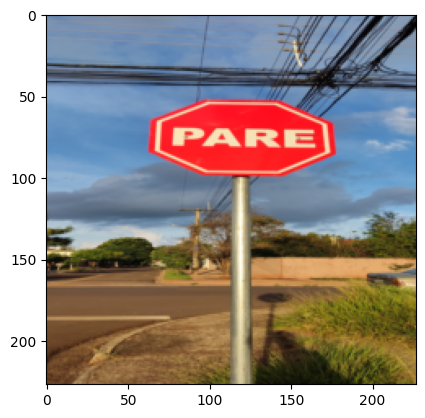

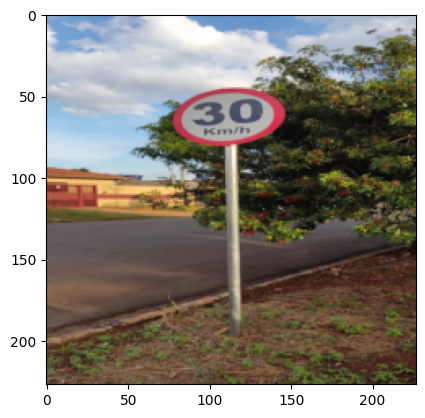

arvore


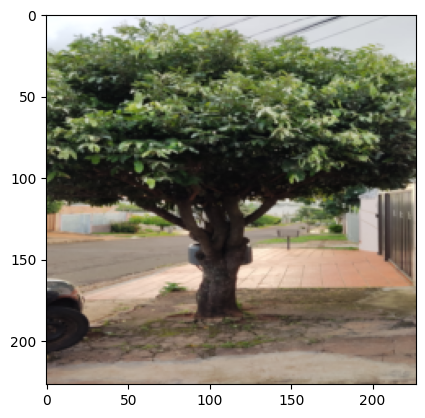

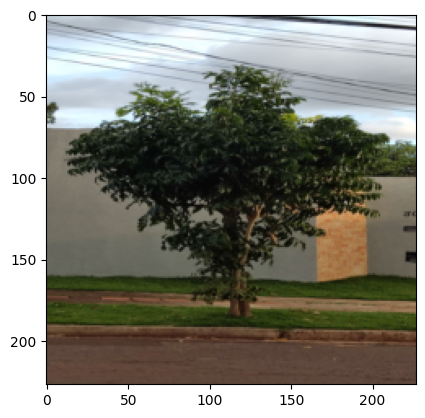

poste


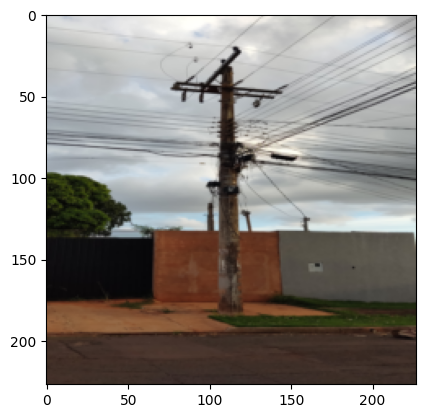

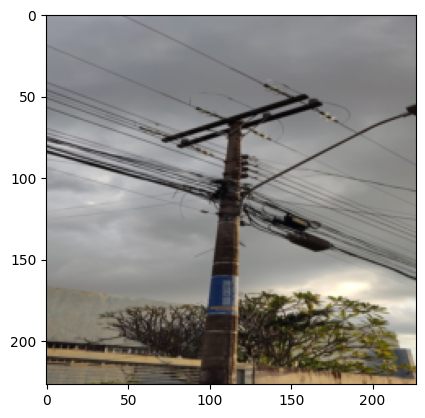

carro


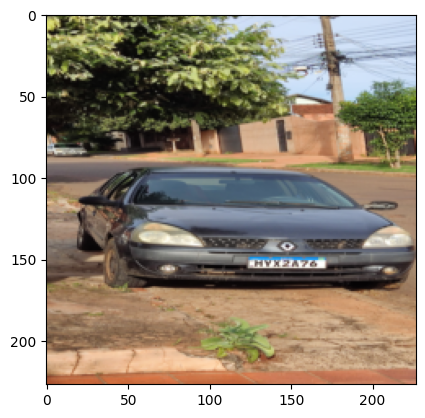

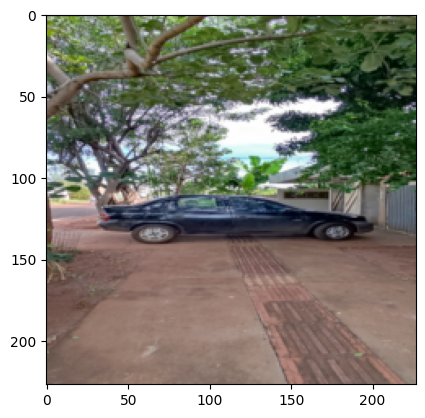

lixeira


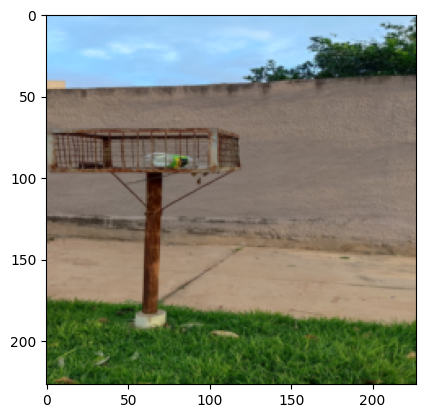

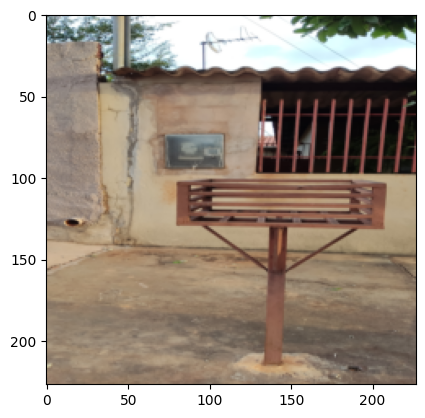

In [ ]:
printing_dataset_rua(image_folder, 2)

## Parte 2 - Implementando modelo

### Parte 2.0 - Montando dataset e organizando em treino, validação e teste

In [ ]:
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

In [ ]:
dataset = RuaDataset(".\\imagens", transform=transform)
#dataset = torchvision.datasets.DatasetFolder("./", loader = image_loader, extensions='jpg', transform=transform)

print("Quantity of images = %d" % len(dataset))
print("Dataset dictionary = "+str(dataset.class_to_idx))
print("Quantity of images for each class = "+str(np.unique(dataset.targets,return_counts=True)))
print("Shape = "+str(dataset[400][0].shape))

Quantity of images = 680
Dataset dictionary = {'arvore': 0, 'carro': 1, 'lixeira': 2, 'placa': 3, 'poste': 4}
Quantity of images for each class = (array([0, 1, 2, 3, 4], dtype=int64), array([136, 136, 136, 136, 136], dtype=int64))
Shape = torch.Size([3, 224, 224])


In [ ]:
dl_train, dl_validation, dl_test = train_validation_test_split(dataset, batch_size=batch_size)

Treino: (array([0, 1, 2, 3, 4], dtype=int64), array([96, 95, 95, 95, 95], dtype=int64))
Validacao: (array([0, 1, 2, 3, 4], dtype=int64), array([20, 21, 20, 20, 21], dtype=int64))
Teste: (array([0, 1, 2, 3, 4], dtype=int64), array([20, 20, 21, 21, 20], dtype=int64))
torch.Size([32, 3, 224, 224]) torch.Size([32])


### Parte 2.1 - Estruturando arquitetura

#### Treinando Modelo com Cifar100

In [ ]:
transform = transforms.Compose([
    transforms.Resize((32,32)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

dataset_train = torchvision.datasets.CIFAR100(root="./Cifar100", download=True)
dataset_test = torchvision.datasets.CIFAR100(root="./Cifar100", train=False, download=True)

print(dataset_train)
print(dataset_test)

dataset_train = Cifar100Dataset(dataset=dataset_train, transform=transform)
dataset_test = Cifar100Dataset(dataset=dataset_test, transform=transform)

Files already downloaded and verified
Files already downloaded and verified
Dataset CIFAR100
    Number of datapoints: 50000
    Root location: ./Cifar100
    Split: Train
Dataset CIFAR100
    Number of datapoints: 10000
    Root location: ./Cifar100
    Split: Test


In [ ]:
batch_size = 50
train_idx, validation_idx = train_test_split(np.arange(len(dataset_train)), test_size=0.2, shuffle=True, random_state=1, stratify=dataset_train.targets)

train_sampler = torch.utils.data.SubsetRandomSampler(train_idx)
validation_sampler = torch.utils.data.SubsetRandomSampler(validation_idx)

dl_train = torch.utils.data.DataLoader(dataset_train,batch_size=batch_size,sampler=train_sampler)
dl_validation = torch.utils.data.DataLoader(dataset_train,batch_size=batch_size,sampler=validation_sampler)
dl_test  = torch.utils.data.DataLoader(dataset_test,batch_size=batch_size)

print(np.unique(dataset_train.targets[train_idx],return_counts=True))
print(np.unique(dataset_train.targets[validation_idx],return_counts=True))
print(np.unique(dataset_test.targets,return_counts=True))

x,y = next(iter(dl_train))

print(x.shape,y.shape)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]), array([400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400, 400,
       400, 400, 400, 400, 400, 400, 400, 400, 400]

In [ ]:
model = TaillowNet0()
opt = torch.optim.SGD(model.parameters(), lr=0.1)
#opt = torch.optim.Adam(model.parameters())
print(torchsummary.summary(model,(3,32,32),device='cpu'))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 50, 30, 30]           1,400
              ReLU-2           [-1, 50, 30, 30]               0
            Conv2d-3           [-1, 50, 29, 29]          10,050
              ReLU-4           [-1, 50, 29, 29]               0
         MaxPool2d-5           [-1, 50, 14, 14]               0
            Conv2d-6          [-1, 100, 12, 12]          45,100
              ReLU-7          [-1, 100, 12, 12]               0
            Conv2d-8          [-1, 100, 11, 11]          40,100
              ReLU-9          [-1, 100, 11, 11]               0
        MaxPool2d-10          [-1, 100, 10, 10]               0
           Conv2d-11            [-1, 200, 8, 8]         180,200
             ReLU-12            [-1, 200, 8, 8]               0
           Conv2d-13            [-1, 200, 7, 7]         160,200
             ReLU-14            [-1, 20

In [ ]:
train_model(model, dl_train, dl_validation, device, opt)
#train_model(model, dl_train, dl_validation, device, opt, load_model=True, dir_model="best_model.pth")

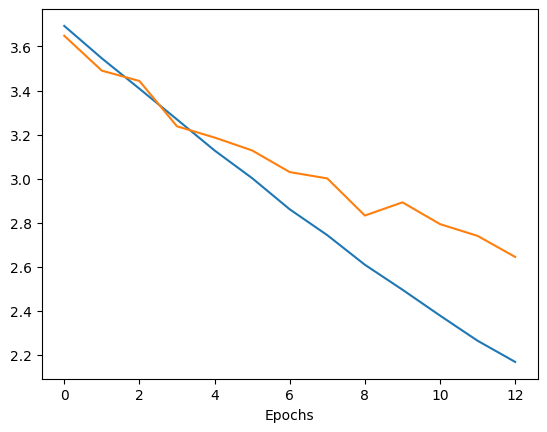

In [ ]:
model = TaillowNet0()
recover = torch.load('./Models/cifar/TaillowNet0.pth')
opt.load_state_dict(recover['optim'])
model.load_state_dict(recover['model'])
loss_train = recover['loss_train']
loss_eval = recover['loss_eval']
epoch = recover['epoch']
plot_loss(loss_train, loss_eval)

In [ ]:
ytrue, lres = evaluate_model(model, dl_test, device)
print("Confusion matrix = \n", metrics.confusion_matrix(ytrue,lres))
print("Accuracy score = %f" % metrics.accuracy_score(ytrue,lres))
print("Precision score = %f" % metrics.precision_score(ytrue,lres, average="micro"))
print("Recall score = %f" % metrics.recall_score(ytrue,lres, average="micro"))
print("F1 score %f" % metrics.f1_score(ytrue,lres, average="micro"))

Confusion matrix = 
 [[67  2  1 ...  0  0  0]
 [ 0 63  0 ...  0  0  0]
 [ 2  0 28 ...  0  3  0]
 ...
 [ 0  0  0 ... 43  0  0]
 [ 0  0  7 ...  1 15  1]
 [ 1  0  1 ...  0  0 26]]
Accuracy score = 0.344500
Precision score = 0.344500
Recall score = 0.344500
F1 score 0.344500


### Parte 2.2 - Ajuste fino

#### TaillowNet0

In [ ]:
transform = transforms.Compose([
    transforms.Resize((32,32)),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])
batch_size = 32

model = TaillowNet0()
model.load_state_dict(torch.load('./Models/TaillowNet0.pth')['model'])
model.classifier[4] = nn.Linear(1000,5)
opt = torch.optim.Adam(model.parameters())
print(model)
print(torchsummary.summary(model,(3,32,32),device='cpu'))

TaillowNet0(
  (backbone): Sequential(
    (0): Conv2d(3, 50, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): Conv2d(50, 50, kernel_size=(2, 2), stride=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(50, 100, kernel_size=(3, 3), stride=(1, 1))
    (6): ReLU()
    (7): Conv2d(100, 100, kernel_size=(2, 2), stride=(1, 1))
    (8): ReLU()
    (9): MaxPool2d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(100, 200, kernel_size=(3, 3), stride=(1, 1))
    (11): ReLU()
    (12): Conv2d(200, 200, kernel_size=(2, 2), stride=(1, 1))
    (13): ReLU()
    (14): MaxPool2d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
    (15): Conv2d(200, 400, kernel_size=(3, 3), stride=(1, 1))
    (16): ReLU()
    (17): Conv2d(400, 400, kernel_size=(2, 2), stride=(1, 1))
    (18): ReLU()
    (19): MaxPool2d(kernel_size=2, stride=1, padding=0, dilation=1, ceil_mode=False)
    (

In [ ]:
train_model(model, dl_train, dl_validation, device, opt)
#train_model(model, dl_train, dl_validation, device, opt, load_model=True, dir_model="best_model.pth")

No model loaded


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

Best model found! saving...
epoch 0 loss_train 1.053 loss_eval 0.601 last_best 1
Best model found! saving...
epoch 1 loss_train 0.477 loss_eval 0.542 last_best 1
epoch 2 loss_train 0.231 loss_eval 0.781 last_best 2
Best model found! saving...
epoch 3 loss_train 0.128 loss_eval 0.465 last_best 1
Best model found! saving...
epoch 4 loss_train 0.078 loss_eval 0.433 last_best 1
Best model found! saving...
epoch 5 loss_train 0.053 loss_eval 0.400 last_best 1
epoch 6 loss_train 0.046 loss_eval 0.611 last_best 2
epoch 7 loss_train 0.053 loss_eval 1.017 last_best 3
epoch 8 loss_train 0.251 loss_eval 1.479 last_best 4
epoch 9 loss_train 0.259 loss_eval 0.762 last_best 5
epoch 10 loss_train 0.126 loss_eval 1.860 last_best 6
epoch 11 loss_train 0.034 loss_eval 0.812 last_best 7
epoch 12 loss_train 0.026 loss_eval 1.189 last_best 8
epoch 13 loss_train 0.090 loss_eval 1.864 last_best 9
epoch 14 loss_train 0.068 loss_eval 0.716 last_best 10
epoch 15 loss_train 0.089 loss_eval 1.980 last_best 11
epoc

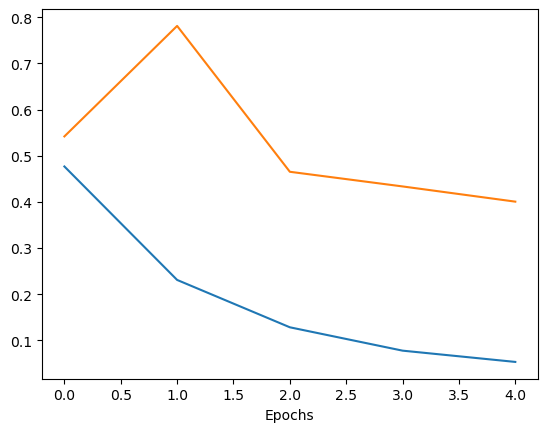

In [ ]:
model = TaillowNet0()
model.classifier[4] = nn.Linear(1000,5)
recover = torch.load('best_model.pth')
opt.load_state_dict(recover['optim'])
model.load_state_dict(recover['model'])
loss_train = recover['loss_train']
loss_eval = recover['loss_eval']
epoch = recover['epoch']
plot_loss(loss_train, loss_eval)

In [ ]:
ytrue, lres = evaluate_model(model, dl_test, device)

In [ ]:
print("Confusion matrix = \n", metrics.confusion_matrix(ytrue,lres))
print("Accuracy score = %f" % metrics.accuracy_score(ytrue,lres))
print("Precision score = %f" % metrics.precision_score(ytrue,lres, average="micro"))
print("Recall score = %f" % metrics.recall_score(ytrue,lres, average="micro"))
print("F1 score %f" % metrics.f1_score(ytrue,lres, average="micro"))

Confusion matrix = 
 [[19  0  1  1  0]
 [ 0 20  0  0  0]
 [ 3  0 12  4  1]
 [ 4  0  0 16  0]
 [ 1  0  0  2 18]]
Accuracy score = 0.833333
Precision score = 0.833333
Recall score = 0.833333
F1 score 0.833333


#### mnasnet1_3

In [ ]:
torchvision.models.list_models()

['alexnet',
 'convnext_base',
 'convnext_large',
 'convnext_small',
 'convnext_tiny',
 'deeplabv3_mobilenet_v3_large',
 'deeplabv3_resnet101',
 'deeplabv3_resnet50',
 'densenet121',
 'densenet161',
 'densenet169',
 'densenet201',
 'efficientnet_b0',
 'efficientnet_b1',
 'efficientnet_b2',
 'efficientnet_b3',
 'efficientnet_b4',
 'efficientnet_b5',
 'efficientnet_b6',
 'efficientnet_b7',
 'efficientnet_v2_l',
 'efficientnet_v2_m',
 'efficientnet_v2_s',
 'fasterrcnn_mobilenet_v3_large_320_fpn',
 'fasterrcnn_mobilenet_v3_large_fpn',
 'fasterrcnn_resnet50_fpn',
 'fasterrcnn_resnet50_fpn_v2',
 'fcn_resnet101',
 'fcn_resnet50',
 'fcos_resnet50_fpn',
 'googlenet',
 'inception_v3',
 'keypointrcnn_resnet50_fpn',
 'lraspp_mobilenet_v3_large',
 'maskrcnn_resnet50_fpn',
 'maskrcnn_resnet50_fpn_v2',
 'maxvit_t',
 'mc3_18',
 'mnasnet0_5',
 'mnasnet0_75',
 'mnasnet1_0',
 'mnasnet1_3',
 'mobilenet_v2',
 'mobilenet_v3_large',
 'mobilenet_v3_small',
 'mvit_v1_b',
 'mvit_v2_s',
 'quantized_googlenet',
 '

In [ ]:
weight_enum = torchvision.models.get_model_weights("shufflenet_v2_x1_0")
print([weight for weight in weight_enum])

[ShuffleNet_V2_X1_0_Weights.IMAGENET1K_V1]


In [ ]:
transform = torchvision.models.MNASNet1_3_Weights.IMAGENET1K_V1.transforms()
batch_size = 16

model = torchvision.models.get_model("mnasnet1_3", weights="IMAGENET1K_V1")
model.classifier[1] = nn.Linear(1280,5)
opt = torch.optim.Adam(model.parameters())
print(model)
print(torchsummary.summary(model,(3,32,32),device='cpu'))

MNASNet(
  (layers): Sequential(
    (0): Conv2d(3, 40, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(40, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(40, 40, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=40, bias=False)
    (4): BatchNorm2d(40, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): Conv2d(40, 24, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (7): BatchNorm2d(24, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
    (8): Sequential(
      (0): _InvertedResidual(
        (layers): Sequential(
          (0): Conv2d(24, 72, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(72, eps=1e-05, momentum=0.00029999999999996696, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(72, 

In [ ]:
train_model(model, dl_train, dl_validation, device, opt)

No model loaded


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/7 [00:00<?, ?it/s]

Best model found! saving...
epoch 0 loss_train 0.463 loss_eval 0.653 last_best 1
epoch 1 loss_train 0.169 loss_eval 14.973 last_best 2
epoch 2 loss_train 0.162 loss_eval 17.016 last_best 3
epoch 3 loss_train 0.187 loss_eval 74.138 last_best 4
epoch 4 loss_train 0.300 loss_eval 37.528 last_best 5
epoch 5 loss_train 0.100 loss_eval 131.185 last_best 6
epoch 6 loss_train 0.081 loss_eval 126.936 last_best 7
epoch 7 loss_train 0.105 loss_eval 543.247 last_best 8
epoch 8 loss_train 0.035 loss_eval 344.691 last_best 9
epoch 9 loss_train 0.029 loss_eval 654.133 last_best 10
epoch 10 loss_train 0.034 loss_eval 1217.712 last_best 11
epoch 11 loss_train 0.061 loss_eval 2399.077 last_best 12
epoch 12 loss_train 0.102 loss_eval 1771.256 last_best 13
epoch 13 loss_train 0.056 loss_eval 1374.883 last_best 14
epoch 14 loss_train 0.019 loss_eval 1593.709 last_best 15
epoch 15 loss_train 0.091 loss_eval 1425.044 last_best 16


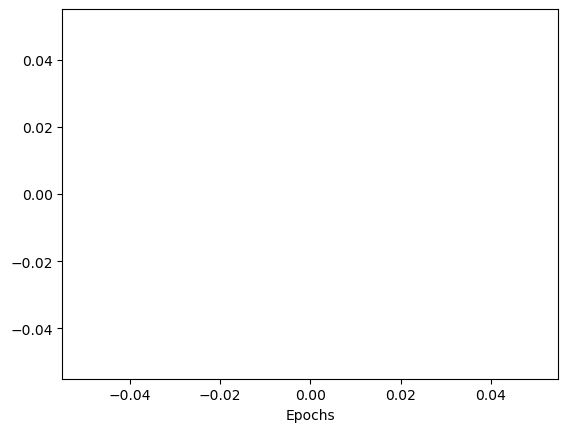

In [ ]:
recover = torch.load('.\\Models\\final\\mnasnet1_3.pth')
opt.load_state_dict(recover['optim'])
model.load_state_dict(recover['model'])
loss_train = recover['loss_train']
loss_eval = recover['loss_eval']
epoch = recover['epoch']
plot_loss(loss_train, loss_eval)

In [ ]:
ytrue, lres = evaluate_model(model, dl_test, device)
print("Confusion matrix = \n", metrics.confusion_matrix(ytrue,lres))
print("Accuracy score = %f" % metrics.accuracy_score(ytrue,lres))
print("Precision score = %f" % metrics.precision_score(ytrue,lres, average="micro"))
print("Recall score = %f" % metrics.recall_score(ytrue,lres, average="micro"))
print("F1 score %f" % metrics.f1_score(ytrue,lres, average="micro"))

Confusion matrix = 
 [[20  0  0  0  0]
 [ 0 20  0  0  0]
 [ 0  0 19  2  0]
 [ 0  0  4 16  0]
 [ 1  0  0  4 16]]
Accuracy score = 0.892157
Precision score = 0.892157
Recall score = 0.892157
F1 score 0.892157


#### EfficientNet_B2

In [ ]:
transform = torchvision.models.EfficientNet_B2_Weights.IMAGENET1K_V1.transforms()
batch_size = 4

model = torchvision.models.get_model("efficientnet_b2", weights="IMAGENET1K_V1")
model.classifier[1] = nn.Linear(1408,5)
opt = torch.optim.Adam(model.parameters())
print(model)
print(torchsummary.summary(model,(3,228,228),device='cpu'))

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

In [ ]:
train_model(model, dl_train, dl_validation, device, opt)

No model loaded


  0%|          | 0/119 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

Best model found! saving...
epoch 0 loss_train 0.771 loss_eval 0.197 last_best 1
epoch 1 loss_train 0.457 loss_eval 0.236 last_best 2
Best model found! saving...
epoch 2 loss_train 0.280 loss_eval 0.183 last_best 1
epoch 3 loss_train 0.297 loss_eval 0.195 last_best 2
Best model found! saving...
epoch 4 loss_train 0.326 loss_eval 0.147 last_best 1
Best model found! saving...
epoch 5 loss_train 0.170 loss_eval 0.125 last_best 1
epoch 6 loss_train 0.197 loss_eval 0.231 last_best 2
Best model found! saving...
epoch 7 loss_train 0.197 loss_eval 0.096 last_best 1
epoch 8 loss_train 0.085 loss_eval 0.230 last_best 2
epoch 9 loss_train 0.135 loss_eval 0.217 last_best 3
epoch 10 loss_train 0.135 loss_eval 0.750 last_best 4
epoch 11 loss_train 0.162 loss_eval 15.635 last_best 5
epoch 12 loss_train 0.208 loss_eval 0.204 last_best 6
Best model found! saving...
epoch 13 loss_train 0.073 loss_eval 0.094 last_best 1
epoch 14 loss_train 0.041 loss_eval 0.156 last_best 2
epoch 15 loss_train 0.132 loss_

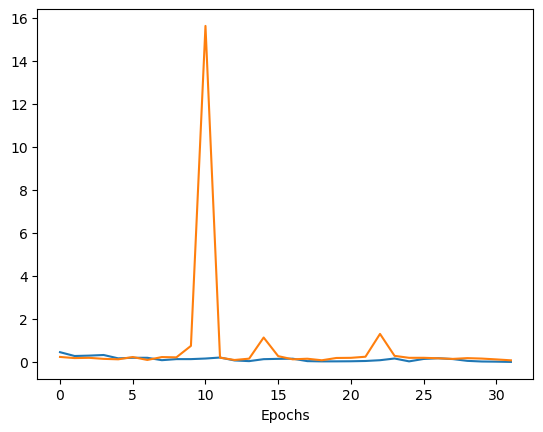

In [ ]:
recover = torch.load('.\\Models\\final\\EfficientNet_B2.pth')
opt.load_state_dict(recover['optim'])
model.load_state_dict(recover['model'])
loss_train = recover['loss_train']
loss_eval = recover['loss_eval']
epoch = recover['epoch']
plot_loss(loss_train, loss_eval)

In [ ]:
ytrue, lres = evaluate_model(model, dl_test, device)
print("Confusion matrix = \n", metrics.confusion_matrix(ytrue,lres))
print("Accuracy score = %f" % metrics.accuracy_score(ytrue,lres))
print("Precision score = %f" % metrics.precision_score(ytrue,lres, average="micro"))
print("Recall score = %f" % metrics.recall_score(ytrue,lres, average="micro"))
print("F1 score %f" % metrics.f1_score(ytrue,lres, average="micro"))

Confusion matrix = 
 [[18  0  0  0  2]
 [ 0 21  0  0  0]
 [ 1  0 19  0  0]
 [ 0  0  0 19  1]
 [ 0  0  0  0 21]]
Accuracy score = 0.960784
Precision score = 0.960784
Recall score = 0.960784
F1 score 0.960784


#### shufflenet_v2_x1_0

In [ ]:
transform = torchvision.models.ShuffleNet_V2_X1_0_Weights.IMAGENET1K_V1.transforms()
batch_size = 32

model = torchvision.models.get_model("shufflenet_v2_x1_0", weights="IMAGENET1K_V1")
model.fc = nn.Linear(1024,5)
opt = torch.optim.Adam(model.parameters())
print(model)
print(torchsummary.summary(model,(3,224,224),device='cpu'))

ShuffleNetV2(
  (conv1): Sequential(
    (0): Conv2d(3, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (stage2): Sequential(
    (0): InvertedResidual(
      (branch1): Sequential(
        (0): Conv2d(24, 24, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), groups=24, bias=False)
        (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): Conv2d(24, 58, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (3): BatchNorm2d(58, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (4): ReLU(inplace=True)
      )
      (branch2): Sequential(
        (0): Conv2d(24, 58, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(58, eps=1e-05, momentum=0.1, affine=True, track_running_

In [ ]:
train_model(model, dl_train, dl_validation, device, opt)

No model loaded


  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/4 [00:00<?, ?it/s]

Best model found! saving...
epoch 0 loss_train 1.381 loss_eval 0.695 last_best 1
Best model found! saving...
epoch 1 loss_train 0.688 loss_eval 0.173 last_best 1
Best model found! saving...
epoch 2 loss_train 0.235 loss_eval 0.169 last_best 1
Best model found! saving...
epoch 3 loss_train 0.101 loss_eval 0.152 last_best 1
epoch 4 loss_train 0.060 loss_eval 0.410 last_best 2
epoch 5 loss_train 0.067 loss_eval 0.178 last_best 3
epoch 6 loss_train 0.048 loss_eval 0.211 last_best 4
epoch 7 loss_train 0.024 loss_eval 0.220 last_best 5
epoch 8 loss_train 0.059 loss_eval 0.248 last_best 6
epoch 9 loss_train 0.046 loss_eval 0.232 last_best 7
epoch 10 loss_train 0.038 loss_eval 0.227 last_best 8
epoch 11 loss_train 0.028 loss_eval 0.225 last_best 9
epoch 12 loss_train 0.038 loss_eval 0.182 last_best 10
epoch 13 loss_train 0.059 loss_eval 0.199 last_best 11
Best model found! saving...
epoch 14 loss_train 0.041 loss_eval 0.121 last_best 1
epoch 15 loss_train 0.020 loss_eval 0.132 last_best 2
epoc

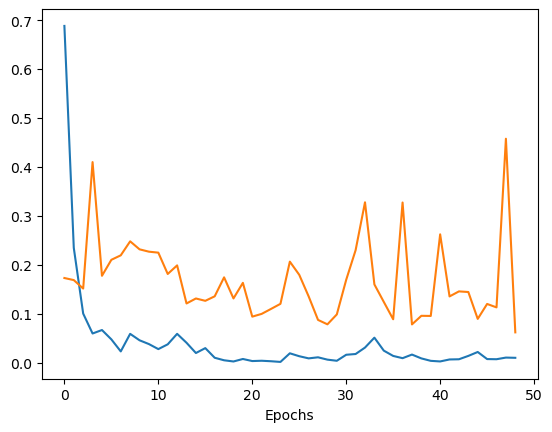

In [ ]:
recover = torch.load('.\\Models\\final\\shufflenet_v2_x1_0.pth')
opt.load_state_dict(recover['optim'])
model.load_state_dict(recover['model'])
loss_train = recover['loss_train']
loss_eval = recover['loss_eval']
epoch = recover['epoch']
plot_loss(loss_train, loss_eval)

In [ ]:
ytrue, lres = evaluate_model(model, dl_test, device)
print("Confusion matrix = \n", metrics.confusion_matrix(ytrue,lres))
print("Accuracy score = %f" % metrics.accuracy_score(ytrue,lres))
print("Precision score = %f" % metrics.precision_score(ytrue,lres, average="micro"))
print("Recall score = %f" % metrics.recall_score(ytrue,lres, average="micro"))
print("F1 score %f" % metrics.f1_score(ytrue,lres, average="micro"))

Confusion matrix = 
 [[17  0  0  1  2]
 [ 0 20  0  0  0]
 [ 0  0 21  0  0]
 [ 0  0  1 20  0]
 [ 0  0  0  0 20]]
Accuracy score = 0.960784
Precision score = 0.960784
Recall score = 0.960784
F1 score 0.960784


# Testando com outras imagens

In [ ]:
#del model
#torch.cuda.empty_cache()

In [ ]:
def teste_imagem(model, device, classes, image_directory, transform):
    model.to(device)
    model.eval()
    img = image_loader(image_directory)
    data = transform(img)
    data = data.unsqueeze(0)
    data = data.to(device)

    pred = model(data)
    print(pred)
    pred = torch.max(pred.data, 1)
    plt.title(classes[pred.indices[0].data])
    plt.imshow(img)
    plt.show()

tensor([[ 1.9103, -2.2527, -1.2454, -2.5897, -1.9658]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


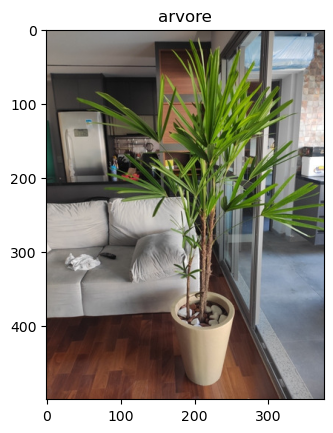

In [ ]:
image_directory = "E:\\Downloads\\arvore.jpg"
teste_imagem(model=model, device=device, classes=dataset.classes, image_directory=image_directory, transform=transform)

In [ ]:
dataset.classes

['arvore', 'carro', 'lixeira', 'placa', 'poste']

tensor([[-1.5736, -3.1604, -2.7982, -2.3933,  2.2147]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


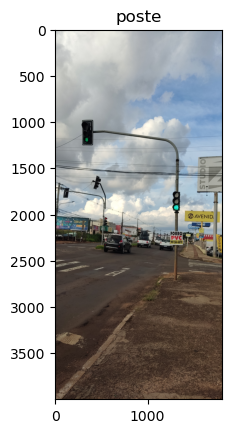

tensor([[-2.5877, -3.8619, -3.0415,  2.4935, -2.1163]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


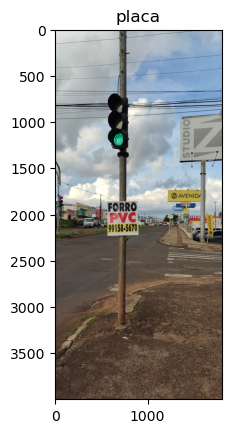

tensor([[-2.6704, -2.5769, -1.9869, -1.8017,  2.2043]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


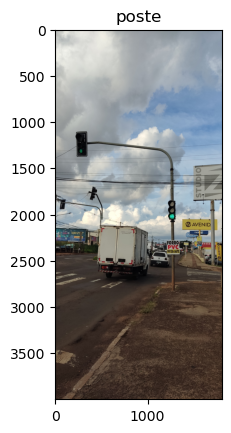

tensor([[-6.5309, -6.2593, -4.7990,  3.2780,  0.1117]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


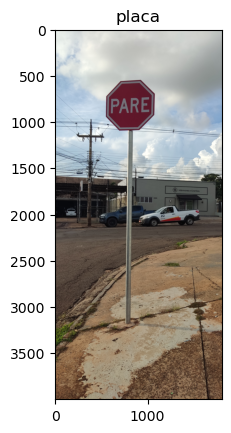

tensor([[-5.6071, -3.7618, -4.3106, -4.9311,  5.2239]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


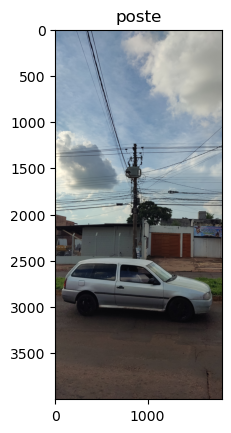

tensor([[ 0.8719, -3.0884, -2.6071,  0.1100, -2.1402]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


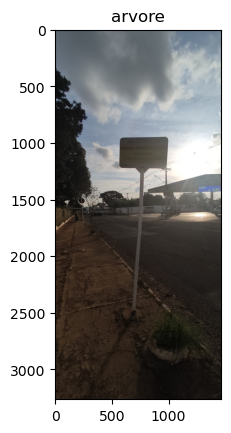

tensor([[-3.7333, -3.5707, -2.8938,  3.5028, -1.1743]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


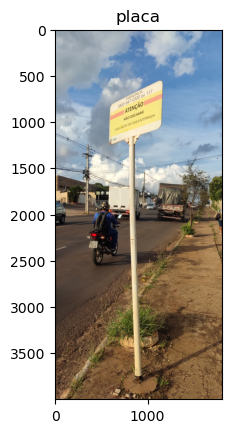

tensor([[ 0.6463, -3.6487, -2.9899, -0.4651, -2.2341]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


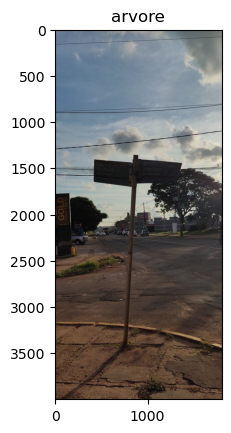

tensor([[-4.7432, -4.2595, -3.3068,  5.3621, -2.7838]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


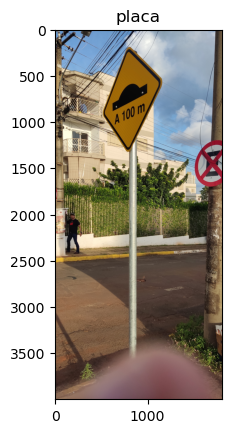

tensor([[-10.3746,  -9.3774,  -6.5426,  12.6002,  -7.0454]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


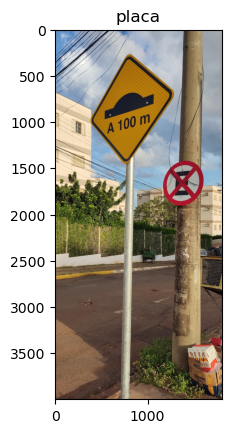

tensor([[-5.7377, -4.9718, -4.3191,  3.8893, -0.8617]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


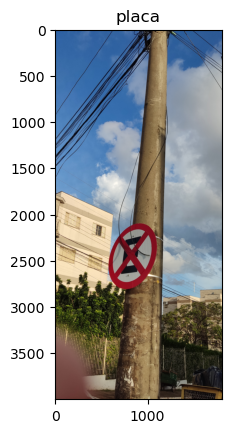

tensor([[-0.1634, -3.4192, -3.1715, -3.1146,  1.6573]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


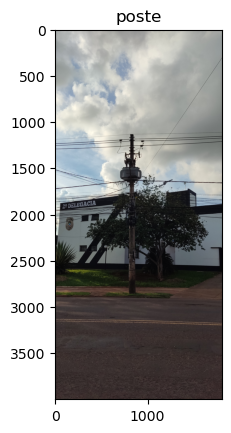

tensor([[-0.3479, -3.8380, -3.7270,  1.1258, -2.8582]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


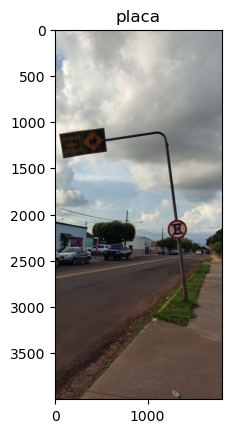

tensor([[-5.5693,  0.3368, -4.2327, -2.8371, -0.2661]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


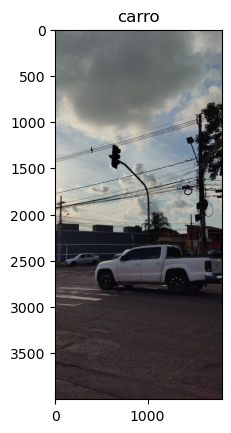

tensor([[-7.1030, -6.9299, 10.3738, -7.5519, -6.2725]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


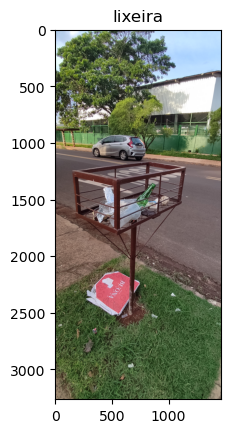

tensor([[-2.2236, -1.9180,  0.5468, -0.3538, -1.7946]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


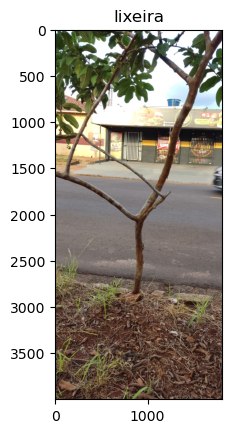

tensor([[ 1.9926, -5.3530, -4.2660, -0.2310, -3.9731]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


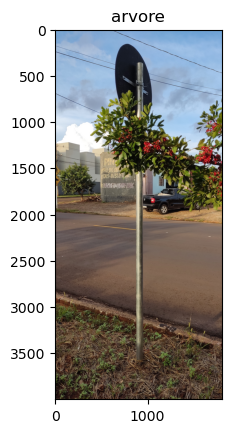

tensor([[ 3.4293, -2.6378, -3.3448, -4.4134, -4.1358]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


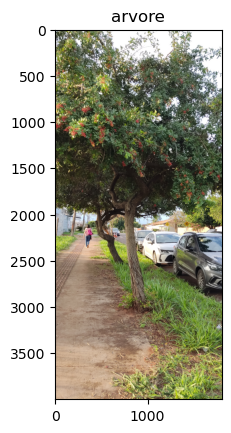

tensor([[ 4.1487, -3.7620, -2.8921, -3.5015, -2.4797]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


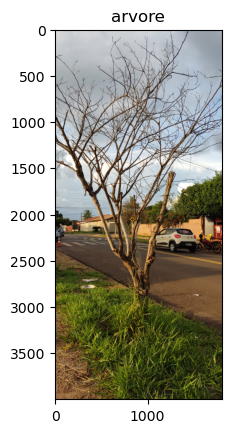

tensor([[-1.6745,  2.0730, -2.8227, -3.3070, -3.5858]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


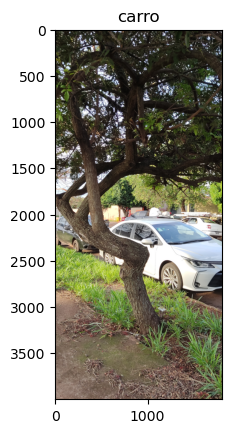

tensor([[ 4.6139, -4.5859, -2.7219, -4.4335, -3.8436]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


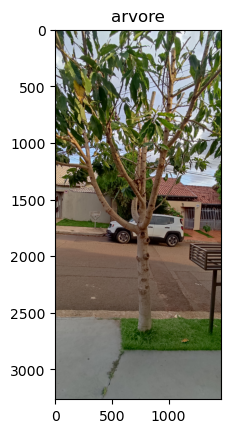

tensor([[ 5.6998, -4.6982, -3.7991, -4.1615, -3.6672]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


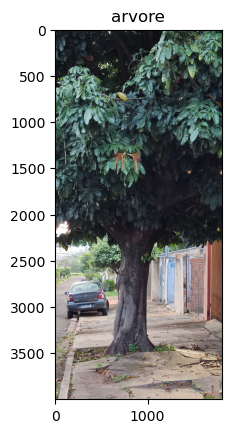

tensor([[ 7.0696, -5.6777, -4.7109, -5.1370, -4.3890]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


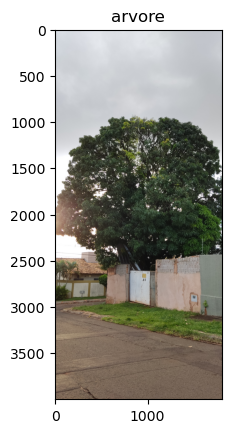

tensor([[ 4.6932, -3.7652, -3.1737, -3.3845, -2.8805]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


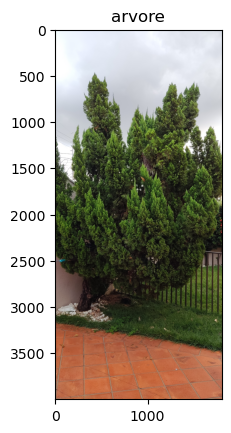

tensor([[-1.0883, -2.3892, -0.2895, -0.1274, -1.7474]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


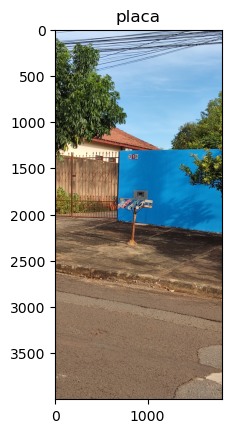

tensor([[-2.8809, -3.6678,  4.1379, -3.1905, -2.9672]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


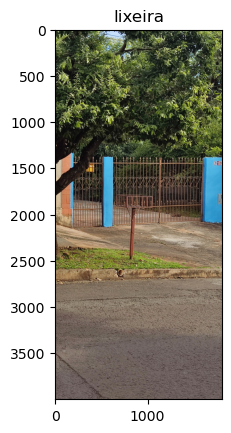

tensor([[-5.1596,  0.0701,  2.2247, -4.1192, -5.0335]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


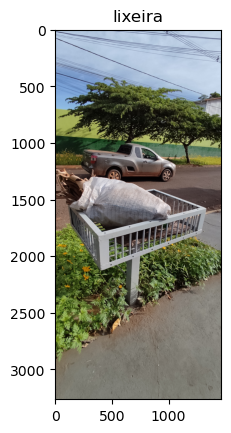

tensor([[ 3.4339, -4.0331, -3.0107, -3.8462, -1.6822]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


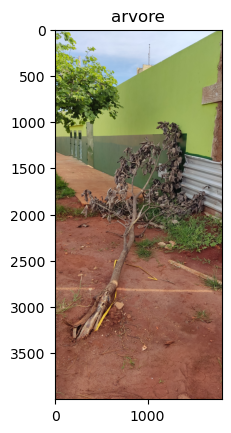

tensor([[ 5.8827, -5.5594, -4.7034, -4.9088, -3.3411]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


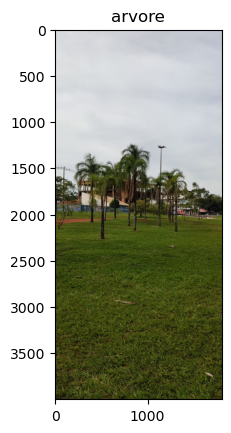

tensor([[-5.0233, -4.6692, -4.2824, -3.6988,  5.1030]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


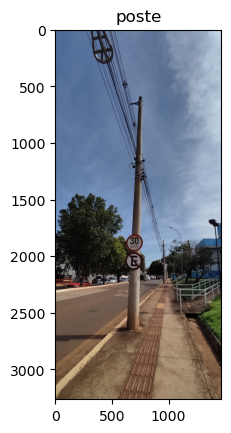

tensor([[-6.2761, -5.8412, -4.5355,  6.7025, -3.5250]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


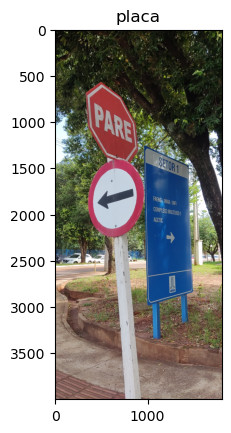

tensor([[-1.0100, -4.8925,  2.3555, -3.8002, -3.4432]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


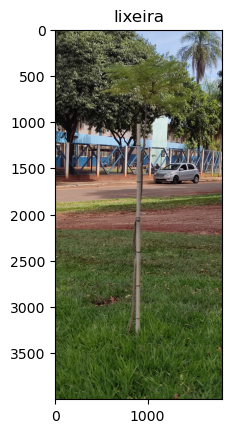

tensor([[-3.6719, -4.3078, -1.4873,  3.5804, -3.5375]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


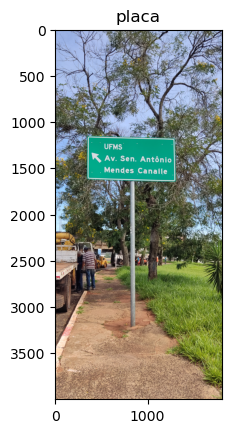

tensor([[-3.0984, -1.8015, -2.3108,  1.1145, -0.3984]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


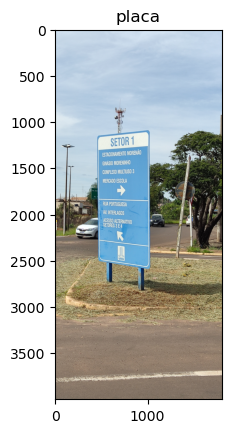

tensor([[ 4.5257, -3.6364, -3.0392, -3.3281, -2.6698]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


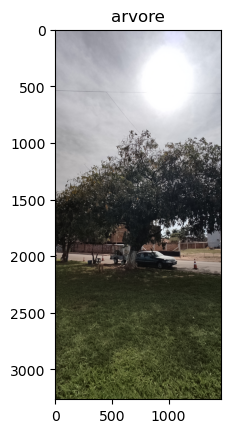

tensor([[ 2.9422, -4.0847, -3.3322, -1.4792, -3.1433]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


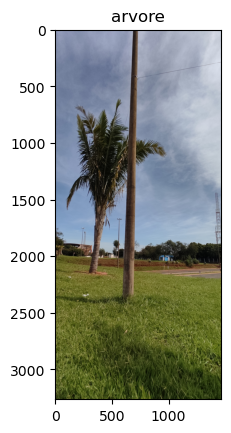

tensor([[-5.1521, -1.3994, -0.6160,  0.3989, -3.6606]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


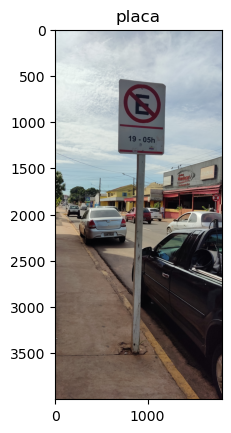

tensor([[-5.7126, -5.8156,  7.2260, -4.8814, -4.7708]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


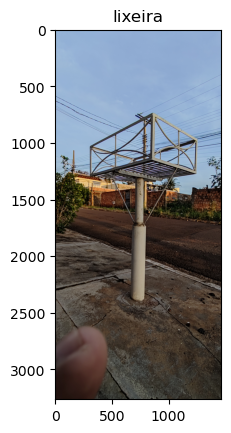

tensor([[-5.2622, -3.9222,  5.7052, -5.4421, -3.9945]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


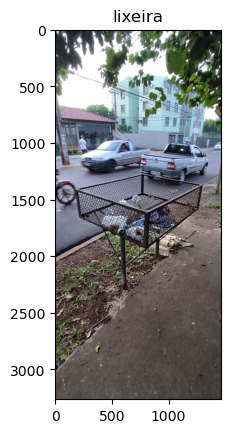

tensor([[-4.2392, -4.8274, -3.4932,  4.1749, -1.9286]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


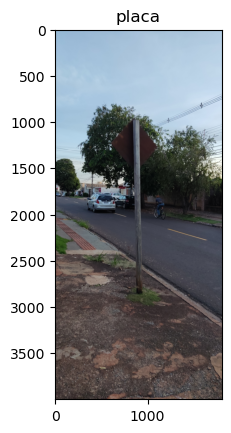

tensor([[-5.1578, -4.8424, -3.7440, -4.4287,  6.1736]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


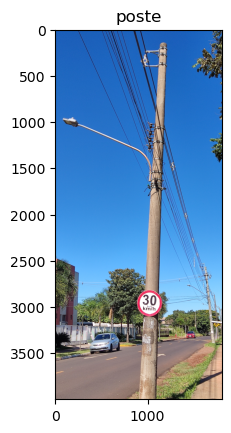

tensor([[-4.7187, -4.9998, -3.9333, -4.6091,  6.0636]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


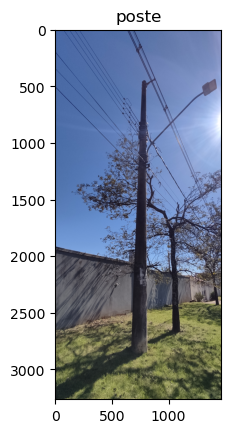

tensor([[-0.0340, -3.7244, -3.0148,  1.3562, -2.8418]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


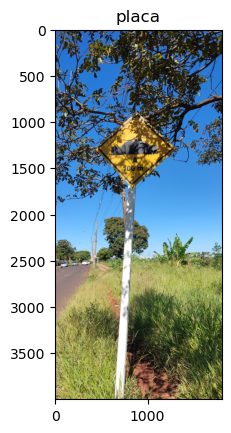

tensor([[-4.7452, -4.5263, -3.2558, -2.8967,  4.4666]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


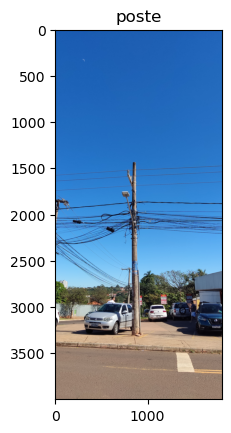

tensor([[ 1.7696, -3.5693, -0.1941, -3.5307, -2.8779]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


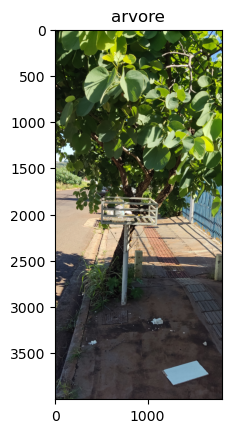

tensor([[-3.9166, -4.1934, -3.4921,  5.0794, -3.3625]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


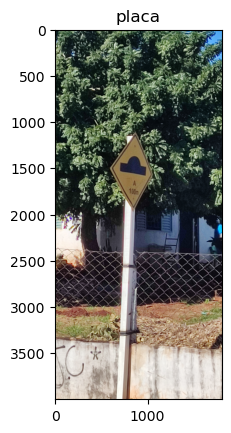

tensor([[ 0.1407, -1.1020, -0.3509, -2.2557, -1.7697]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


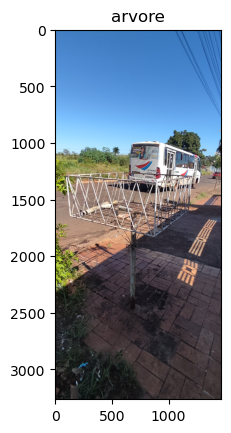

tensor([[ 5.3934, -5.1043, -4.2285, -4.6496, -2.9978]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


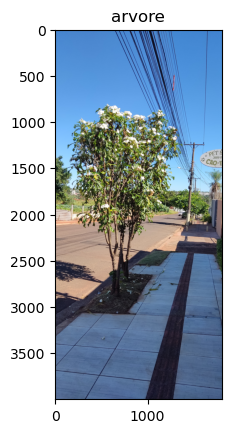

tensor([[-5.8119, -5.1831, -3.8115,  6.4883, -3.2316]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


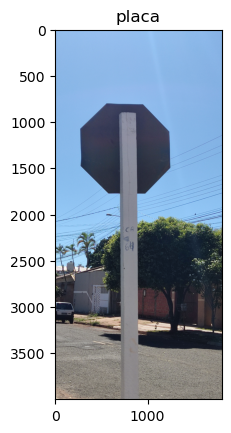

tensor([[-1.0879, -5.3804, -4.0225,  2.6578, -4.1202]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


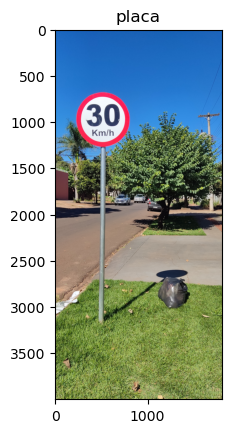

tensor([[-3.1034, -2.9704, -2.3331, -2.6861,  3.2737]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


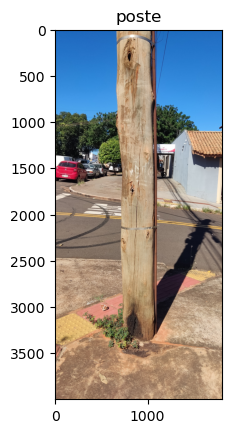

tensor([[-6.5548, -4.2384, -4.2569,  6.5226, -5.3478]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


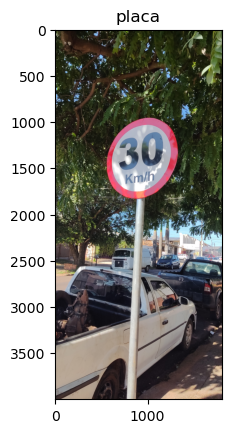

tensor([[-3.4140, -2.3898, -0.4310, -1.7422, -1.7701]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


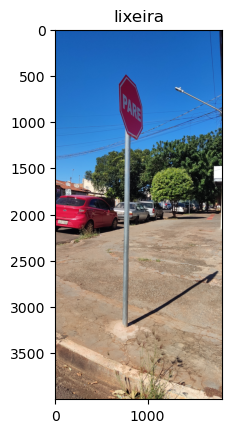

tensor([[-9.5052, -9.0001, -6.7491, -8.4794, 11.4527]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


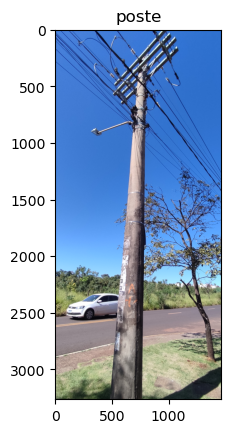

tensor([[-2.5232, -2.3008, -2.0938, -1.2187,  2.1398]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


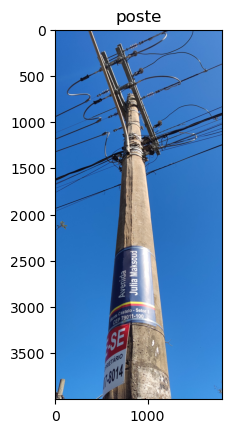

tensor([[-9.5213, -8.4256, -6.6157, 11.4920, -6.1497]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


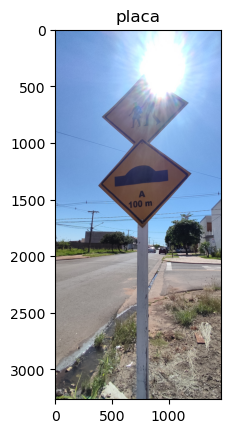

tensor([[-5.9480, -5.8335, -5.0300,  7.6234, -4.3727]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


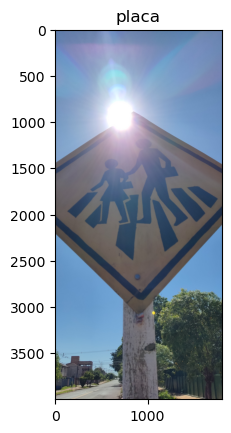

tensor([[-5.9777, -4.5261, -4.1989,  6.7378, -4.0326]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


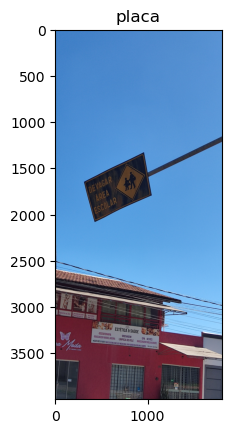

tensor([[-2.7351, -1.7472, -1.3685,  0.6273, -0.3964]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


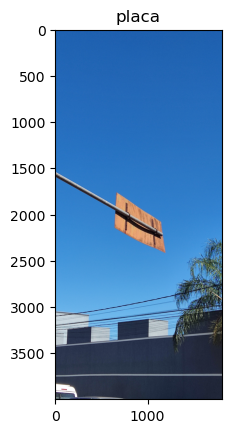

tensor([[-3.5917,  0.1180, -1.8230, -1.2470, -1.9364]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


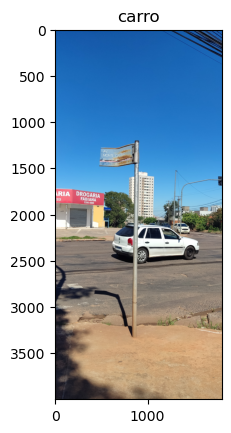

tensor([[-4.7001, -2.3883, -3.1608,  3.6076, -2.4748]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


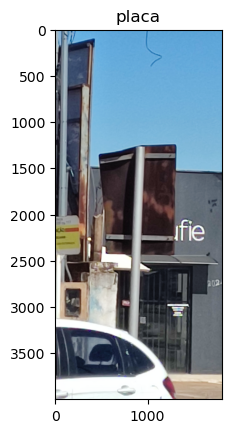

tensor([[-2.1996, -1.9589, -1.2028,  0.4131,  0.1643]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


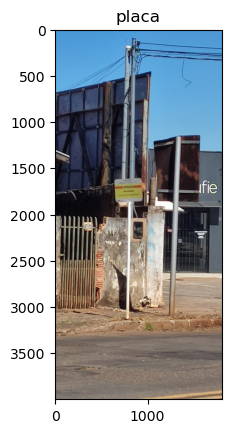

tensor([[-2.6613, -2.1959,  1.2482, -1.5814, -0.6506]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


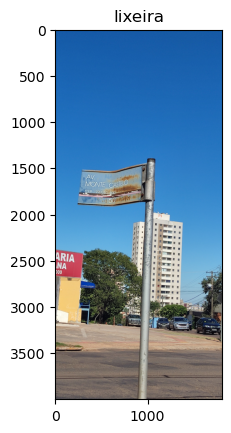

tensor([[-8.9120, -6.9169, -6.5182,  7.0060, -2.4423]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


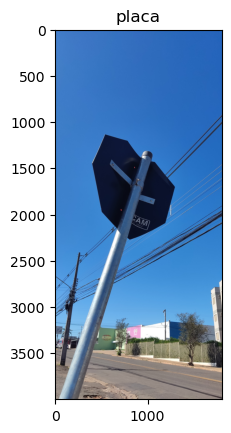

tensor([[ 5.6254, -4.6704, -3.9621, -4.0862, -3.3853]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


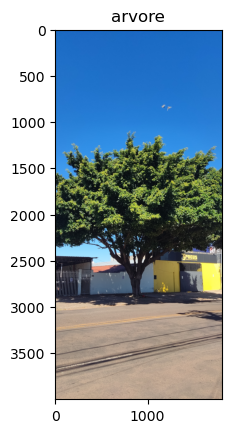

tensor([[-3.5894, -3.1244, -2.6335,  3.5784, -1.5939]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


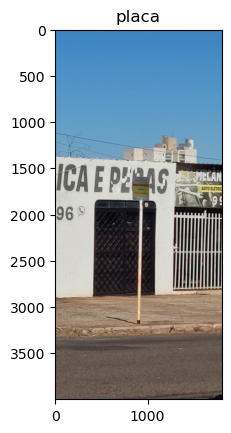

tensor([[-5.0745,  5.1646, -2.6438, -3.8428, -4.6601]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


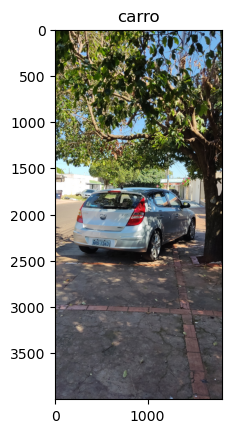

tensor([[-3.0347, -4.1737, -1.6221, -1.2253,  0.6802]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


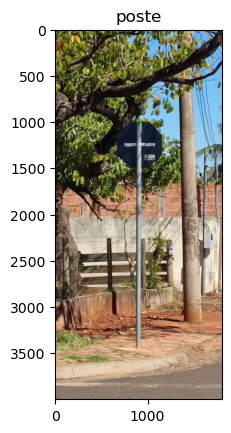

tensor([[-6.1459, -6.9012, -5.2785,  8.3686, -5.6381]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


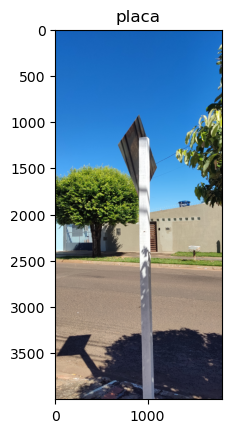

tensor([[-3.4115, -3.1956, -1.3383, -1.8015,  2.1705]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


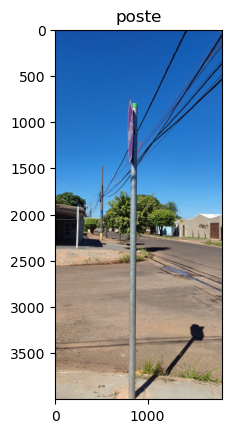

tensor([[-6.0723,  6.5715, -3.8757, -4.1241, -5.6175]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


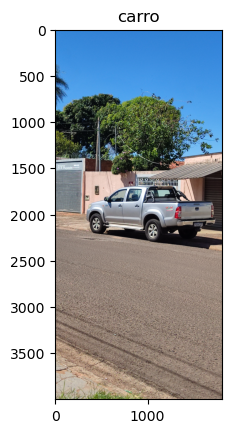

tensor([[-6.6637, -6.1296, -5.0967, -0.6632,  3.9219]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


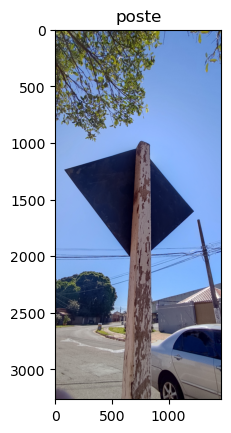

tensor([[-5.9720,  6.4915, -3.8356, -4.1060, -5.5109]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


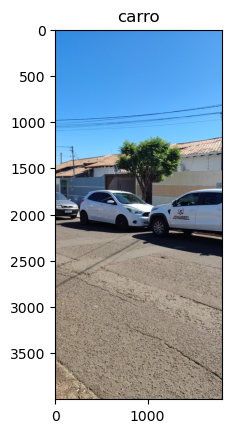

tensor([[-1.3005,  1.5900, -3.5037, -3.4048, -4.1952]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


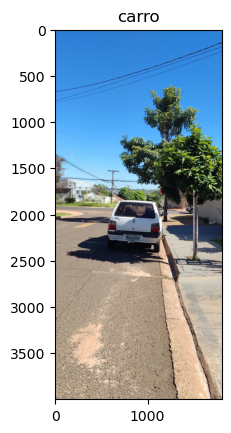

tensor([[-4.1606, -4.2517, -3.6341, -3.6224,  5.2409]], device='cuda:0',
       grad_fn=<AddmmBackward0>)


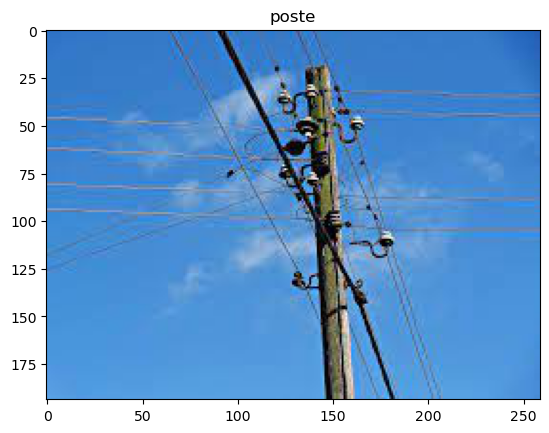

In [ ]:
for image in os.listdir(".\\outros"):
    if os.path.splitext(image)[-1]==".jpg":
        teste_imagem(model=model, device=device, classes=dataset.classes, image_directory=".\\outros\\"+image, transform=transform)